# XAI - homework 4

Mateusz Biesiadowski mb406097

# Report

## Task 1

$f(x_1, x_2) = (x_1 + x_2)^2$

$X_1, X_2$ ~ $U_{[-1,1]}$

$X_1 = X_2$

We can conclude that:

$E[X] = 0$ and $E[X^2] = \frac{1}{3}$

PDP:

$g_{PD}^1(z) = E_{X_2}[(z + x_2)^2]$ = $z^2 + 2z E_{X_2}[x_2] + E_{X_2}[x_2^2]$ = $z^2 + \frac{1}{3}$ 

## Task 2

### 2) Calculate the what-if explanations of these predictions using Ceteris Paribus profiles (also called What-if plots)

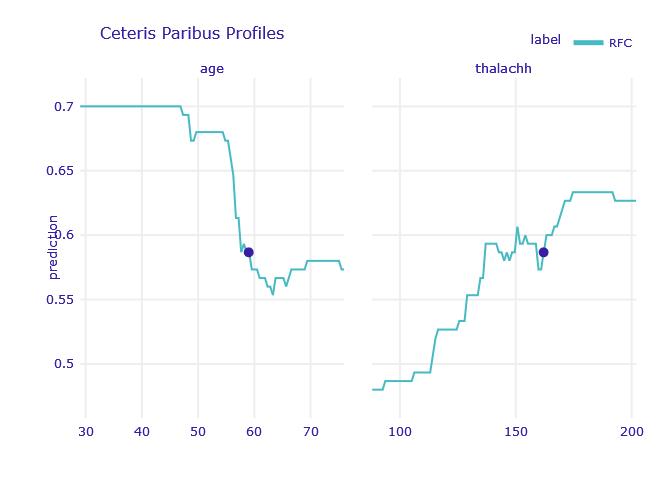

### 3) Find two observations in the data set, such that they have different CP profiles

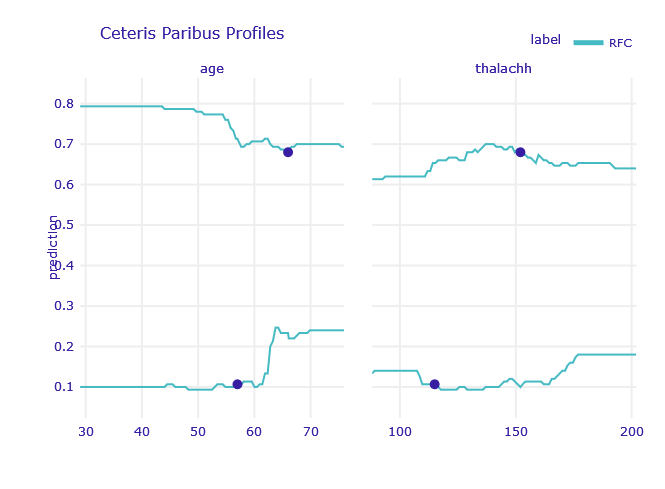

### 4) Compare CP, which is a local explanation, with PDP, which is a global explanation



Ceteris Paribus

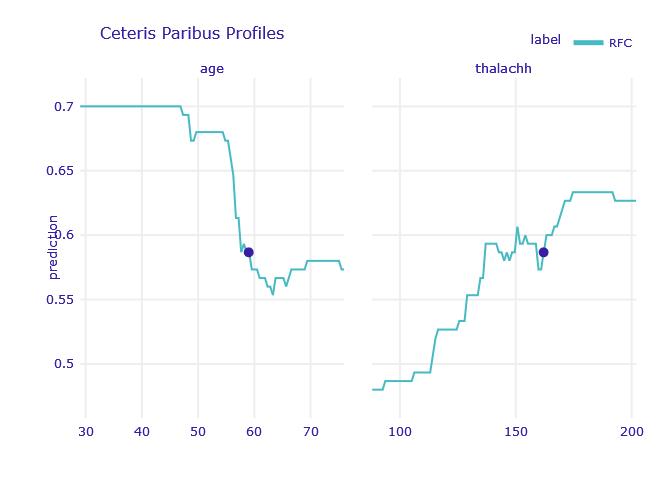

Partial Dependence Plots

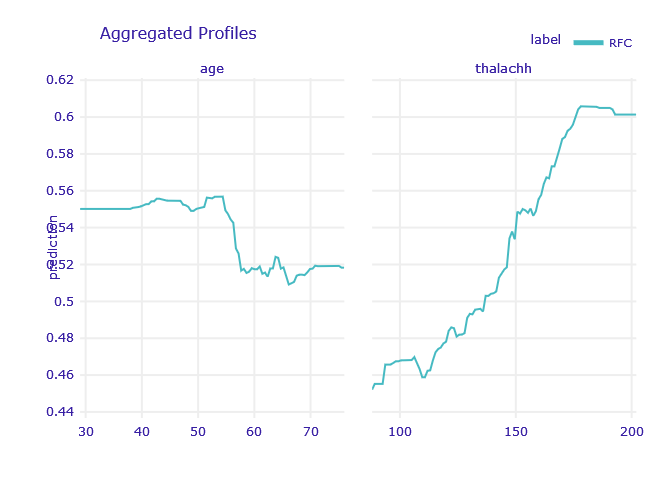

Partial Dependence Plots 2

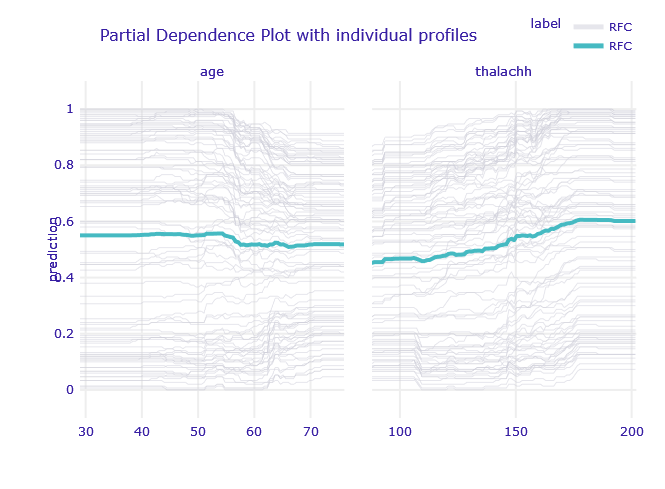

### 5) Compare PDP between between at least two different models

Random forest classifier vs Decision tree classifier

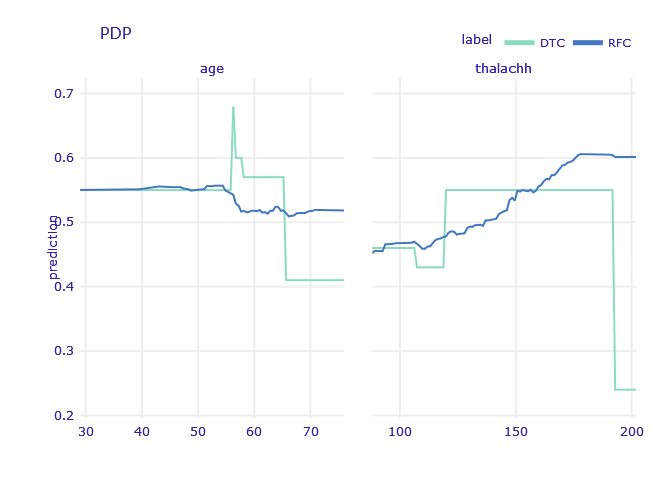

# Appendix

## Imports

In [66]:
!pip install dalex 1> /dev/null
!pip install shap 1> /dev/null
!pip install lime 1> /dev/null

In [67]:
import os
import random

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import lime
import shap
import dalex as dx

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [68]:
#@title Set Credentials

kaggle_username = '' #@param {type:"string"}
kaggle_api_key = '' #@param {type:"string"}

try:
    import kaggle
except OSError:
    with open("/root/.kaggle/kaggle.json", "w+") as f:
        f.write('{"username":"' + kaggle_username + '","key":"' + kaggle_api_key + '"}')

os.system("chmod 600 /root/.kaggle/kaggle.json")

0

## Data

### Download dataset

In [69]:
# import kaggle

!kaggle datasets download -d rashikrahmanpritom/heart-attack-analysis-prediction-dataset
!unzip /content/heart-attack-analysis-prediction-dataset.zip

heart-attack-analysis-prediction-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  /content/heart-attack-analysis-prediction-dataset.zip
replace heart.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: heart.csv               
  inflating: o2Saturation.csv        


### Get data

In [70]:
df = pd.read_csv("/content/heart.csv")

#Preprocessing

### Config

In [71]:
CATEGORICAL_COLUMNS = ['cp', 'restecg', 'slp', 'caa', 'thall']
RANDOM_STATE = 2137
TEST_SIZE = 0.33

### One hot encoding

In [72]:
for col in CATEGORICAL_COLUMNS:
    one_hot = pd.get_dummies(df[col])
    one_hot = one_hot.add_prefix(col + "_")
    df = df.drop(col, axis=1)
    df = pd.concat([df, one_hot], axis=1)

In [73]:
df.head()

,age,sex,trtbps,chol,fbs,thalachh,exng,oldpeak,output,cp_0,...,slp_2,caa_0,caa_1,caa_2,caa_3,caa_4,thall_0,thall_1,thall_2,thall_3
0,63,1,145,233,1,150,0,2.3,1,0,...,0,1,0,0,0,0,0,1,0,0
1,37,1,130,250,0,187,0,3.5,1,0,...,0,1,0,0,0,0,0,0,1,0
2,41,0,130,204,0,172,0,1.4,1,0,...,1,1,0,0,0,0,0,0,1,0
3,56,1,120,236,0,178,0,0.8,1,0,...,1,1,0,0,0,0,0,0,1,0
4,57,0,120,354,0,163,1,0.6,1,1,...,1,1,0,0,0,0,0,0,1,0


### Split data

In [74]:
X, y = df.drop('output', axis=1), df.output

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE)

## Model

In [75]:
model_rfc = RandomForestClassifier(n_estimators=150, random_state=RANDOM_STATE)

model_rfc.fit(X_train, y_train)

RandomForestClassifier(n_estimators=150, random_state=2137)

In [90]:
def pf_classifier_categorical(model, df):
    df.loc[:, df.dtypes == 'object'] =\
        df.select_dtypes(['object'])\
        .apply(lambda x: x.astype('category'))
    return model.predict_proba(df)[:, 1]

explainer_rf = dx.Explainer(model_rfc, X_test, y_test, predict_function=pf_classifier_categorical, label="RFC")

Preparation of a new explainer is initiated

  -> data              : 100 rows 27 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 100 values
  -> model_class       : sklearn.ensemble._forest.RandomForestClassifier (default)
  -> label             : RFC
  -> predict function  : <function pf_classifier_categorical at 0x7f062c8c6a70> will be used
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.00667, mean = 0.543, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.933, mean = -0.0435, max = 0.747
  -> model_info        : package sklearn

A new explainer has been created!


## Evaluate

In [77]:
explainer_rf.model_performance()

,recall,precision,f1,accuracy,auc
RFC,0.94,0.79661,0.862385,0.85,0.9276


In [78]:
explainer_rf.model_parts().result

,variable,dropout_loss,label
0,cp_3,0.06552,RFC
1,cp_1,0.06904,RFC
2,chol,0.06936,RFC
3,slp_0,0.07120,RFC
4,caa_2,0.07186,RFC
5,caa_3,0.07188,RFC
6,thall_0,0.07222,RFC
7,restecg_1,0.07222,RFC
8,trtbps,0.07228,RFC
9,_full_model_,0.07240,RFC


### Calculate the predictions for some selected observations

In [79]:
NO_OBSERVATIONS = 4

model_rfc.predict(X_test[:NO_OBSERVATIONS])

array([1, 1, 0, 1])

### Ceteris Paribus

In [80]:
cp = explainer_rf.predict_profile(new_observation=X_test.iloc[[3]])

Calculating ceteris paribus: 100%|██████████| 27/27 [00:01<00:00, 16.18it/s]


In [81]:
cp.plot(variables=["age", "thalachh"])

#### Differences in profiles

In [82]:
cp_diff = explainer_rf.predict_profile(new_observation=X_test.iloc[[4, 8]])
cp_diff.plot(variables=['age', 'thalachh'])

Calculating ceteris paribus: 100%|██████████| 27/27 [00:01<00:00, 14.87it/s]


### Partial Dependence Plots

In [84]:
pdp = explainer_rf.model_profile()

Calculating ceteris paribus: 100%|██████████| 27/27 [00:06<00:00,  4.28it/s]


In [85]:
pdp.result

,_vname_,_label_,_x_,_yhat_,_ids_
0,age,RFC,29.00,0.550133,0
1,age,RFC,29.47,0.550133,0
2,age,RFC,29.94,0.550133,0
3,age,RFC,30.41,0.550133,0
4,age,RFC,30.88,0.550133,0
...,...,...,...,...,...
2622,thall_3,RFC,0.96,0.483733,0
2623,thall_3,RFC,0.97,0.483733,0
2624,thall_3,RFC,0.98,0.483733,0
2625,thall_3,RFC,0.99,0.483733,0


In [86]:
pdp.plot(variables=["age", "thalachh"])

In [87]:
pdp.plot(variables=["age", "thalachh"], geom="profiles", title="Partial Dependence Plot with individual profiles")

## Compare RandomForest to DecisionTree

In [89]:
model_dt = DecisionTreeClassifier(random_state=RANDOM_STATE)
model_dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=2137)

In [94]:
explainer_dt = dx.Explainer(model_dt, X_test, y_test, predict_function=pf_classifier_categorical, label="DTC")

Preparation of a new explainer is initiated

  -> data              : 100 rows 27 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 100 values
  -> model_class       : sklearn.tree._classes.DecisionTreeClassifier (default)
  -> label             : DTC
  -> predict function  : <function pf_classifier_categorical at 0x7f062c8c6a70> will be used
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.0, mean = 0.54, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -1.0, mean = -0.04, max = 1.0
  -> model_info        : package sklearn

A new explainer has been created!


In [95]:
pd.concat([explainer_rf.model_performance().result, explainer_dt.model_performance().result]) 

,recall,precision,f1,accuracy,auc
RFC,0.94,0.796610,0.862385,0.85,0.9276
DTC,0.80,0.740741,0.769231,0.76,0.7600


In [96]:
pdp_dt = explainer_dt.model_profile()

Calculating ceteris paribus: 100%|██████████| 27/27 [00:00<00:00, 44.69it/s]


In [98]:
pdp_dt.plot(pdp, variables=["age", "thalachh"], title="PDP")